# Image Statistics Modules
[PIL ImageStat](https://pillow.readthedocs.io/en/3.0.x/reference/ImageStat.html) <br>
```python
from PIL import ImageFile

fp = open("lena.pgm", "rb")

p = ImageFile.Parser()

while 1:
    s = fp.read(1024)
    if not s:
        break
    p.feed(s)

im = p.close()

im.save("copy.jpg")
```

In [1]:
import os
os.getcwd()

'/Users/mojo/git_clone/dlanier/scalygraphic/archive'

In [2]:
import os
from PIL import ImageFile
from PIL.ImageStat import Stat

In [3]:
FILE_EXT = ['.tif', '.png']
im_dir = os.path.abspath('../test/run_dir/results/')
file_list = os.listdir(im_dir)
png_files = []
for maybe_file in file_list:
    _, file_ext = os.path.splitext(maybe_file)
    if file_ext in FILE_EXT:
        print(maybe_file)
        full_file_name = os.path.join(im_dir, maybe_file)
        print('\t%s'%full_file_name)
        p = ImageFile.Parser()
        with open(full_file_name, 'rb') as fp:
            while 1:
                s = fp.read(1024)
                if not s:
                    break
                p.feed(s)
            im = p.close()
            print('type(im)',type(im))
            im_stat = Stat(im)
            stddev = im_stat.stddev
            print(type(stddev), len(stddev), 'stddev')
            for std in stddev:
                print(std)
            print('\n')
            

df1e286acefd651b24fdf706f64009f4f0ef5c25a1ace7bdb8ccb3ec1060f338_large.tif
	/Users/mojo/git_clone/dlanier/scalygraphic/test/run_dir/results/df1e286acefd651b24fdf706f64009f4f0ef5c25a1ace7bdb8ccb3ec1060f338_large.tif
type(im) <class 'PIL.TiffImagePlugin.TiffImageFile'>
<class 'list'> 1 stddev
79.57959817455271


683cd73cea116751117ba5f73282ae2aa839436c6c68af6163fb7746701f8c91_large.tif
	/Users/mojo/git_clone/dlanier/scalygraphic/test/run_dir/results/683cd73cea116751117ba5f73282ae2aa839436c6c68af6163fb7746701f8c91_large.tif
type(im) <class 'PIL.TiffImagePlugin.TiffImageFile'>
<class 'list'> 1 stddev
85.47145028962814


683cd73cea116751117ba5f73282ae2aa839436c6c68af6163fb7746701f8c91_small.tif
	/Users/mojo/git_clone/dlanier/scalygraphic/test/run_dir/results/683cd73cea116751117ba5f73282ae2aa839436c6c68af6163fb7746701f8c91_small.tif
type(im) <class 'PIL.TiffImagePlugin.TiffImageFile'>
<class 'list'> 1 stddev
85.44093184568689


df1e286acefd651b24fdf706f64009f4f0ef5c25a1ace7bdb8ccb3ec1060f338

In [4]:
import os
from collections import OrderedDict
from PIL import ImageFile
from PIL.ImageStat import Stat
import pandas as pd

def get_image_file_stats(imfilename, imfiledirectory=None):
    """ stats_dict, image_input = get_image_file_stats(imfilename, imfiledirectory) """
    
    stats_dict = {}
    full_file_name = os.path.join(imfiledirectory, imfilename)
    if os.path.isfile(full_file_name):
        p = ImageFile.Parser()
        with open(full_file_name, 'rb') as fp:
            while 1:
                s = fp.read(1024)
                if not s:
                    break
                p.feed(s)
            image_input = p.close()
        
        stats_dict = get_image_stats(image_input)
        stats_dict['image_file_name'] = imfilename
        
    else:
        print('Failed to open file:', full_file_name)
        
    return stats_dict, image_input

def get_image_stats(image_input):
    stats_dict = {}
    im_stat = Stat(im)
    stats_dict['extrema'] = im_stat.extrema
    stats_dict['count'] = im_stat.count
    stats_dict['sum'] = im_stat.sum
    stats_dict['sum2'] = im_stat.sum2
    stats_dict['mean'] = im_stat.mean
    stats_dict['median'] = im_stat.median
    stats_dict['rms'] = im_stat.rms
    stats_dict['var'] = im_stat.var
    stats_dict['stddev'] = im_stat.stddev
    
    return stats_dict

def show_image_stats(imfilename, imfiledirectory):
    if imfiledirectory is None:
        imfiledirectory = os.getcwd()
    stats_dict, image_input = get_image_file_stats(imfilename, imfiledirectory)
    for k, v in stats_dict.items():
        print('%20s: '%(k), v,'\n')
    display(image_input)
    
    
def get_images_stats_dataframe(images_dir_list, file_extensions_list):
    """images_stats_dataframe = get_images_stats_dataframe(images_dir_list, file_extensions_list) """
    STATS_KEYS = ["count","extrema","image_file_name","mean","median","rms","stddev","sum","sum2","var"]
    images_stats_dataframe = None
    stats_dict_list = []
    for maybe_image_dir in images_dir_list:
        if os.path.isdir(maybe_image_dir):
            files_list = os.listdir(maybe_image_dir)
            for maybe_file in files_list:
                _, file_ext = os.path.splitext(maybe_file)
                if file_ext in file_extensions_list:
                    stats_dict, _ = get_image_file_stats(maybe_file, maybe_image_dir)
                    stats_dict_list.append(stats_dict)
                    
    images_stats_dataframe = pd.DataFrame(stats_dict_list)
                    
    return images_stats_dataframe
                    
    

             extrema:  [(0, 255)] 

               count:  [1048576] 

                 sum:  [121452365.0] 

                sum2:  [20949501937.0] 

                mean:  [115.82600116729736] 

              median:  [115] 

                 rms:  [141.34709738378035] 

                 var:  [6563.339392413114] 

              stddev:  [81.01443940689286] 

     image_file_name:  683cd73cea116751117ba5f73282ae2aa839436c6c68af6163fb7746701f8c91_large.tif 



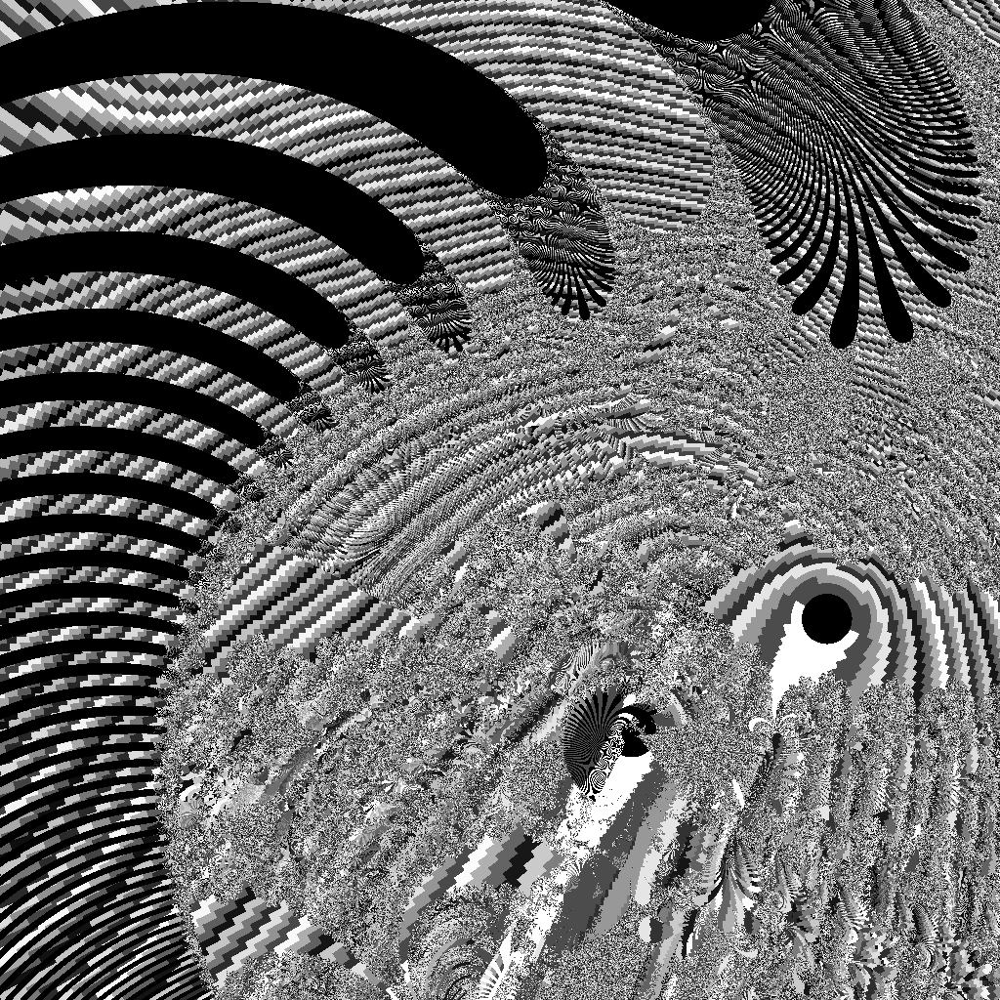

In [5]:
imfilename = '683cd73cea116751117ba5f73282ae2aa839436c6c68af6163fb7746701f8c91_large.tif'
im_dir = os.path.abspath('../test/run_dir/results/')
show_image_stats(imfilename, im_dir)

In [6]:
imfiledir = '/Users/mojo/git_clone/dlanier/La_Machina_Fractal_Arien/images'
imfilename = 'helloKeras.png'

stats_dict, _ = get_image_file_stats(imfilename, imfiledir)
s = '"'
for k in sorted(list(stats_dict.keys())):
    s +=  k + '","'
    
print('[',s[:-2] ,']')

[ "count","extrema","image_file_name","mean","median","rms","stddev","sum","sum2","var" ]


In [9]:
FILE_EXT = ['.png']
# im_dir = os.path.abspath('../images')
im_dir = '/Users/mojo/git_clone/dlanier/La_Machina_Fractal_Arien/images'
images_stats_dataframe = get_images_stats_dataframe([im_dir], FILE_EXT)
images_stats_dataframe

,count,extrema,image_file_name,mean,median,rms,stddev,sum,sum2,var
0,[1048576],"[(0, 255)]",z_conv_nuttin.png,[115.82600116729736],[115],[141.34709738378035],[81.01443940689286],[121452365.0],[20949501937.0],[6563.339392413114]
1,[1048576],"[(0, 255)]",z_conv_passaporta.png,[115.82600116729736],[115],[141.34709738378035],[81.01443940689286],[121452365.0],[20949501937.0],[6563.339392413114]
2,[1048576],"[(0, 255)]",adecPwrAFxLFQNTAAAFD.png,[115.82600116729736],[115],[141.34709738378035],[81.01443940689286],[121452365.0],[20949501937.0],[6563.339392413114]
3,[1048576],"[(0, 255)]",z_conv_AAnglBnSqr16x20.18.03.22_2.13.2009.png,[115.82600116729736],[115],[141.34709738378035],[81.01443940689286],[121452365.0],[20949501937.0],[6563.339392413114]
4,[1048576],"[(0, 255)]",z_conv_AETXerch.9.55.20_7.17.2010.png,[115.82600116729736],[115],[141.34709738378035],[81.01443940689286],[121452365.0],[20949501937.0],[6563.339392413114]
5,[1048576],"[(0, 255)]",helloKeras.png,[115.82600116729736],[115],[141.34709738378035],[81.01443940689286],[121452365.0],[20949501937.0],[6563.339392413114]
6,[1048576],"[(0, 255)]",z_conv_dlanier_big_image.png,[115.82600116729736],[115],[141.34709738378035],[81.01443940689286],[121452365.0],[20949501937.0],[6563.339392413114]
7,[1048576],"[(0, 255)]",z_conv_Tre.png,[115.82600116729736],[115],[141.34709738378035],[81.01443940689286],[121452365.0],[20949501937.0],[6563.339392413114]
8,[1048576],"[(0, 255)]",z_conv_Rad_Hall3272011130324.png,[115.82600116729736],[115],[141.34709738378035],[81.01443940689286],[121452365.0],[20949501937.0],[6563.339392413114]
9,[1048576],"[(0, 255)]",z_conv_Dos.png,[115.82600116729736],[115],[141.34709738378035],[81.01443940689286],[121452365.0],[20949501937.0],[6563.339392413114]


             extrema:  [(0, 255)] 

               count:  [1048576] 

                 sum:  [121452365.0] 

                sum2:  [20949501937.0] 

                mean:  [115.82600116729736] 

              median:  [115] 

                 rms:  [141.34709738378035] 

                 var:  [6563.339392413114] 

              stddev:  [81.01443940689286] 

     image_file_name:  z_conv_nuttin.png 



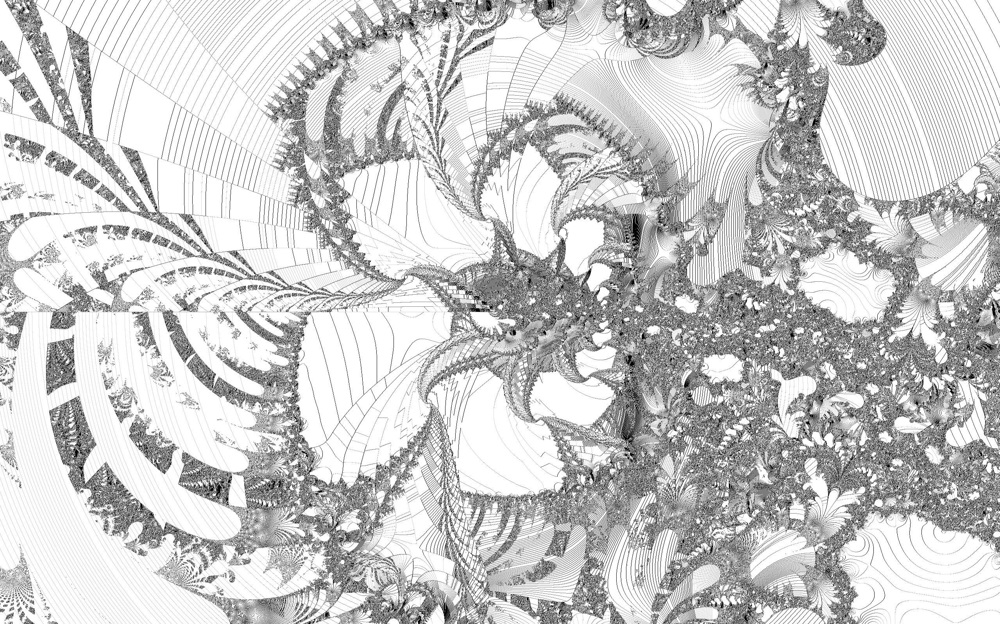

             extrema:  [(0, 255)] 

               count:  [1048576] 

                 sum:  [121452365.0] 

                sum2:  [20949501937.0] 

                mean:  [115.82600116729736] 

              median:  [115] 

                 rms:  [141.34709738378035] 

                 var:  [6563.339392413114] 

              stddev:  [81.01443940689286] 

     image_file_name:  z_conv_passaporta.png 



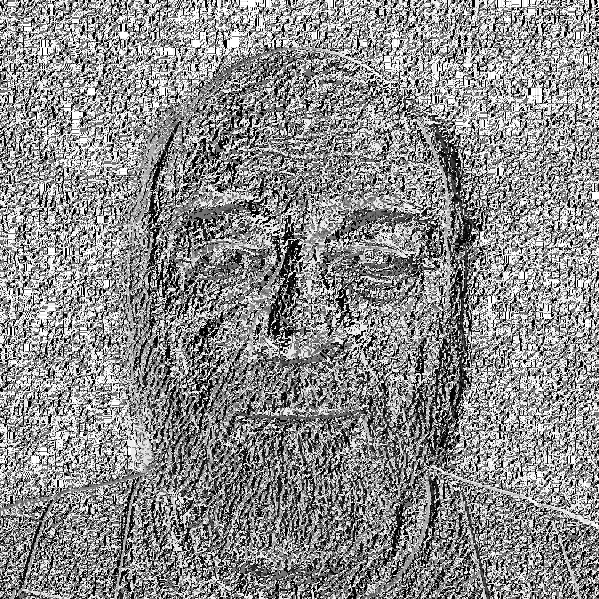

             extrema:  [(0, 255)] 

               count:  [1048576] 

                 sum:  [121452365.0] 

                sum2:  [20949501937.0] 

                mean:  [115.82600116729736] 

              median:  [115] 

                 rms:  [141.34709738378035] 

                 var:  [6563.339392413114] 

              stddev:  [81.01443940689286] 

     image_file_name:  adecPwrAFxLFQNTAAAFD.png 



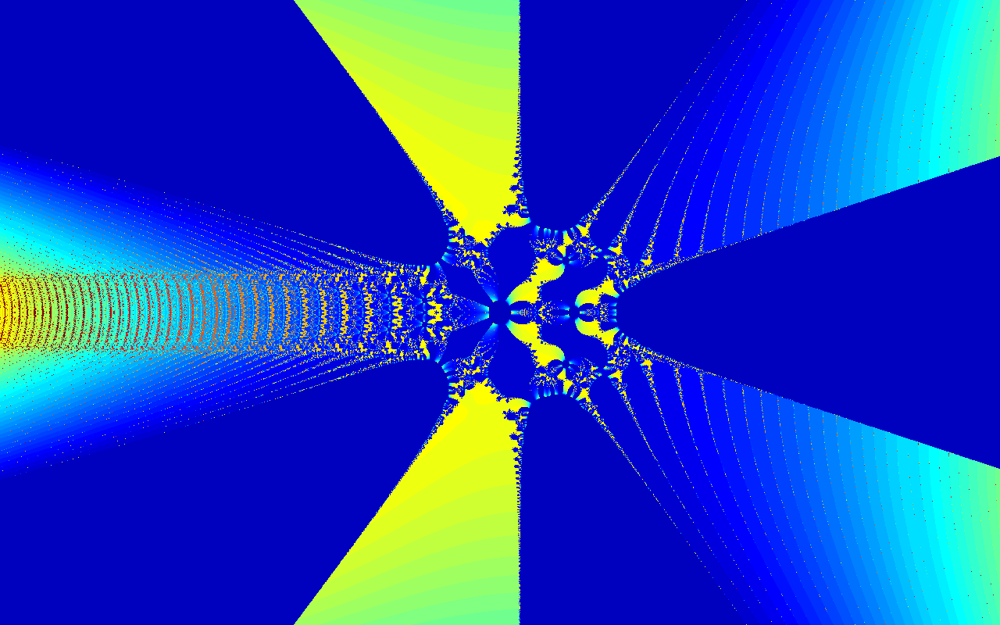

             extrema:  [(0, 255)] 

               count:  [1048576] 

                 sum:  [121452365.0] 

                sum2:  [20949501937.0] 

                mean:  [115.82600116729736] 

              median:  [115] 

                 rms:  [141.34709738378035] 

                 var:  [6563.339392413114] 

              stddev:  [81.01443940689286] 

     image_file_name:  z_conv_AAnglBnSqr16x20.18.03.22_2.13.2009.png 



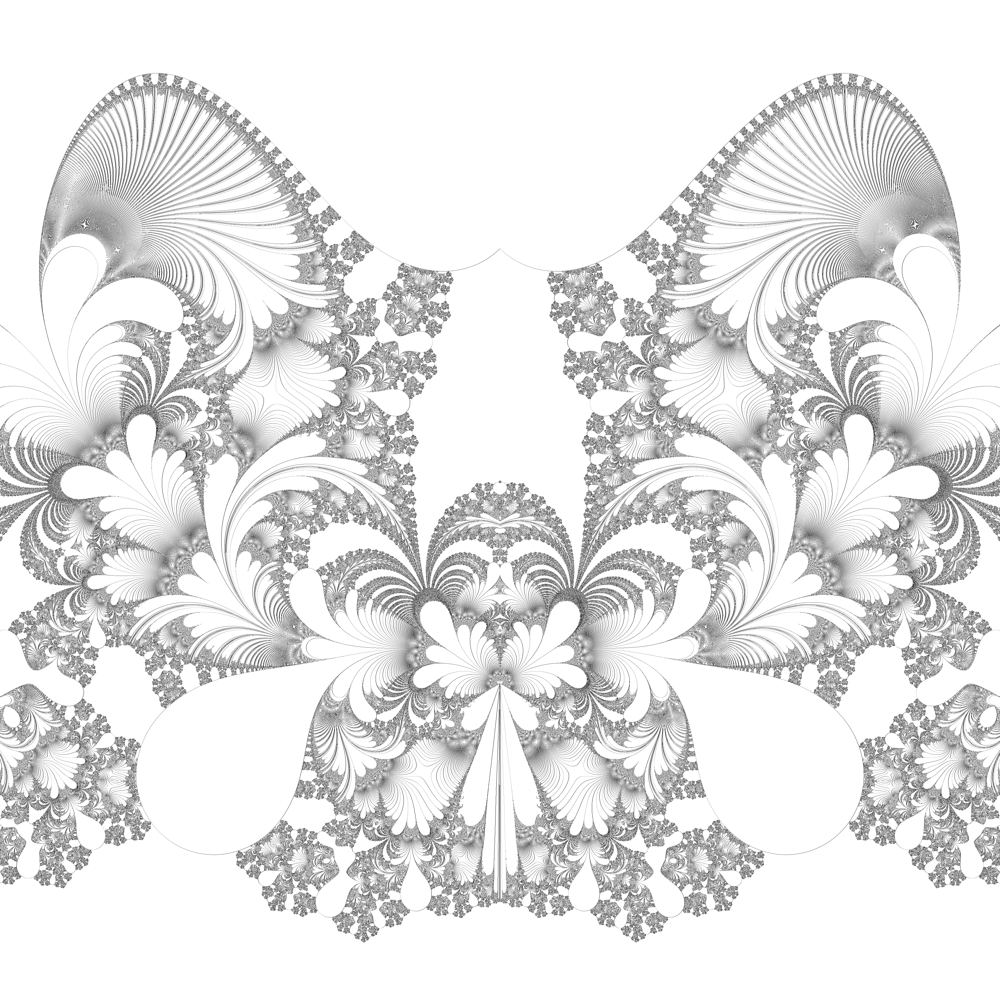

             extrema:  [(0, 255)] 

               count:  [1048576] 

                 sum:  [121452365.0] 

                sum2:  [20949501937.0] 

                mean:  [115.82600116729736] 

              median:  [115] 

                 rms:  [141.34709738378035] 

                 var:  [6563.339392413114] 

              stddev:  [81.01443940689286] 

     image_file_name:  z_conv_AETXerch.9.55.20_7.17.2010.png 



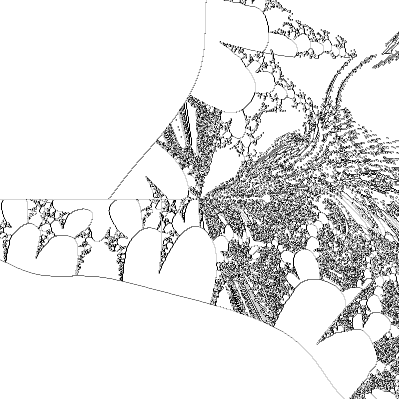

             extrema:  [(0, 255)] 

               count:  [1048576] 

                 sum:  [121452365.0] 

                sum2:  [20949501937.0] 

                mean:  [115.82600116729736] 

              median:  [115] 

                 rms:  [141.34709738378035] 

                 var:  [6563.339392413114] 

              stddev:  [81.01443940689286] 

     image_file_name:  helloKeras.png 



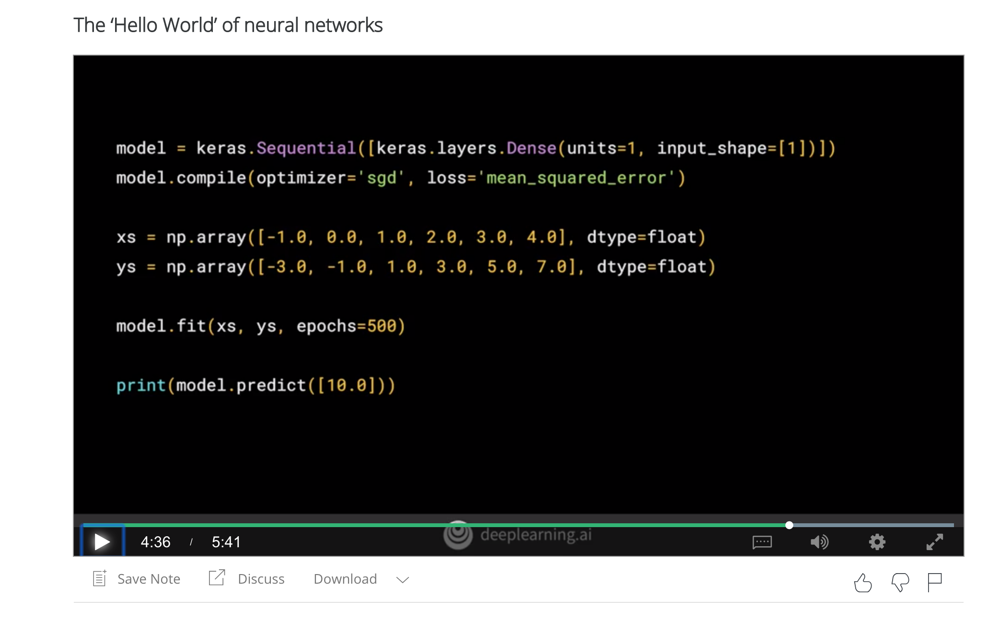

             extrema:  [(0, 255)] 

               count:  [1048576] 

                 sum:  [121452365.0] 

                sum2:  [20949501937.0] 

                mean:  [115.82600116729736] 

              median:  [115] 

                 rms:  [141.34709738378035] 

                 var:  [6563.339392413114] 

              stddev:  [81.01443940689286] 

     image_file_name:  z_conv_dlanier_big_image.png 



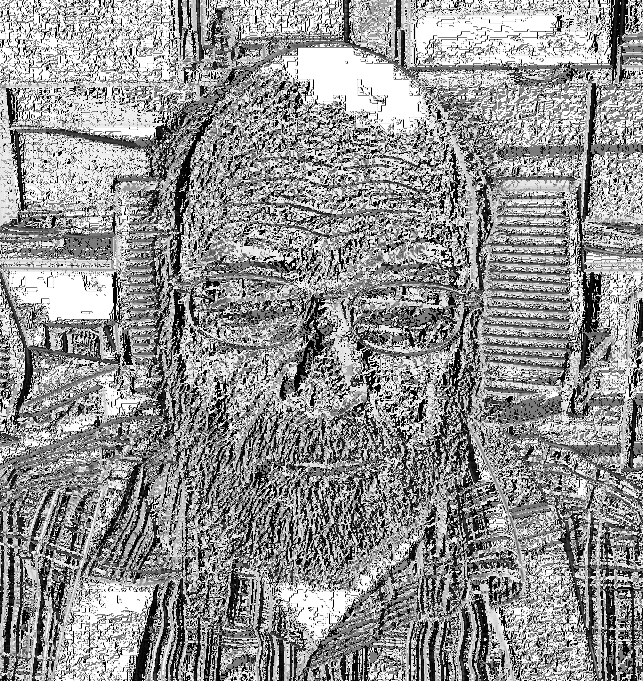

             extrema:  [(0, 255)] 

               count:  [1048576] 

                 sum:  [121452365.0] 

                sum2:  [20949501937.0] 

                mean:  [115.82600116729736] 

              median:  [115] 

                 rms:  [141.34709738378035] 

                 var:  [6563.339392413114] 

              stddev:  [81.01443940689286] 

     image_file_name:  z_conv_Tre.png 



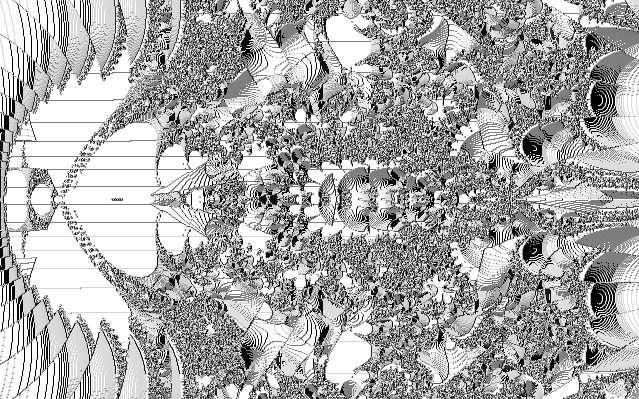

             extrema:  [(0, 255)] 

               count:  [1048576] 

                 sum:  [121452365.0] 

                sum2:  [20949501937.0] 

                mean:  [115.82600116729736] 

              median:  [115] 

                 rms:  [141.34709738378035] 

                 var:  [6563.339392413114] 

              stddev:  [81.01443940689286] 

     image_file_name:  z_conv_Rad_Hall3272011130324.png 



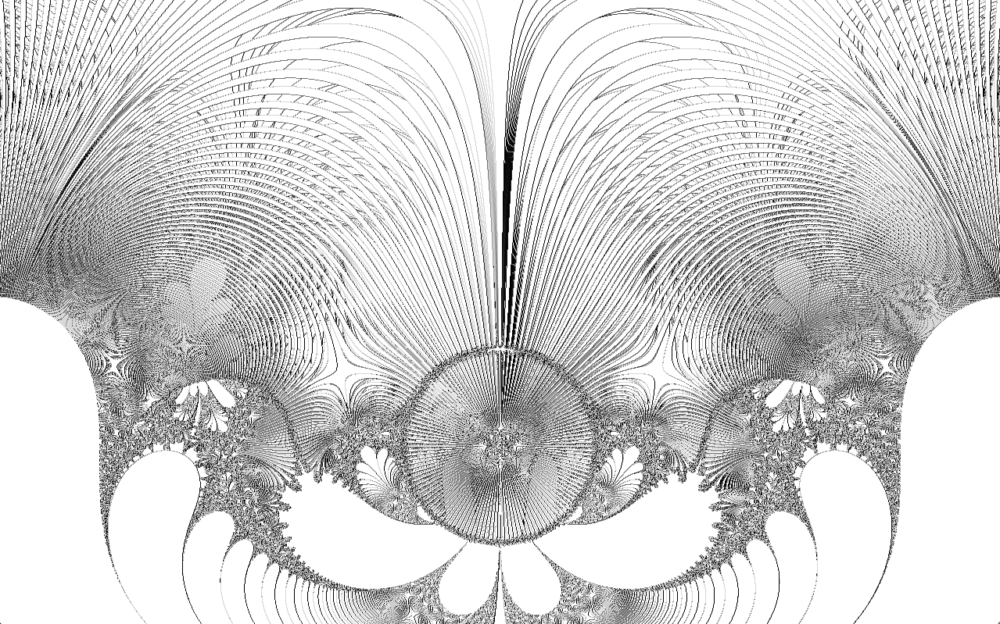

             extrema:  [(0, 255)] 

               count:  [1048576] 

                 sum:  [121452365.0] 

                sum2:  [20949501937.0] 

                mean:  [115.82600116729736] 

              median:  [115] 

                 rms:  [141.34709738378035] 

                 var:  [6563.339392413114] 

              stddev:  [81.01443940689286] 

     image_file_name:  z_conv_Dos.png 



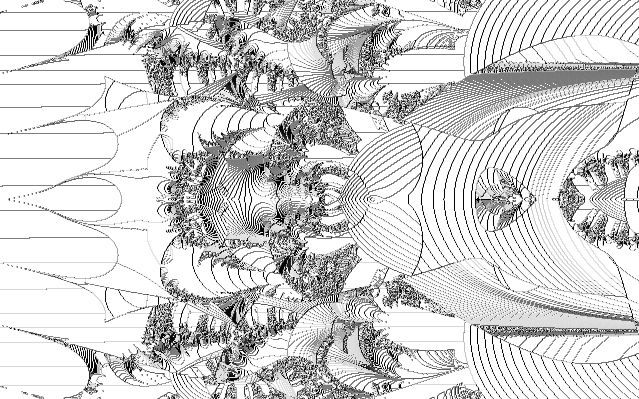

             extrema:  [(0, 255)] 

               count:  [1048576] 

                 sum:  [121452365.0] 

                sum2:  [20949501937.0] 

                mean:  [115.82600116729736] 

              median:  [115] 

                 rms:  [141.34709738378035] 

                 var:  [6563.339392413114] 

              stddev:  [81.01443940689286] 

     image_file_name:  z_conv_RedWing.11.15.01_10.20.2008.png 



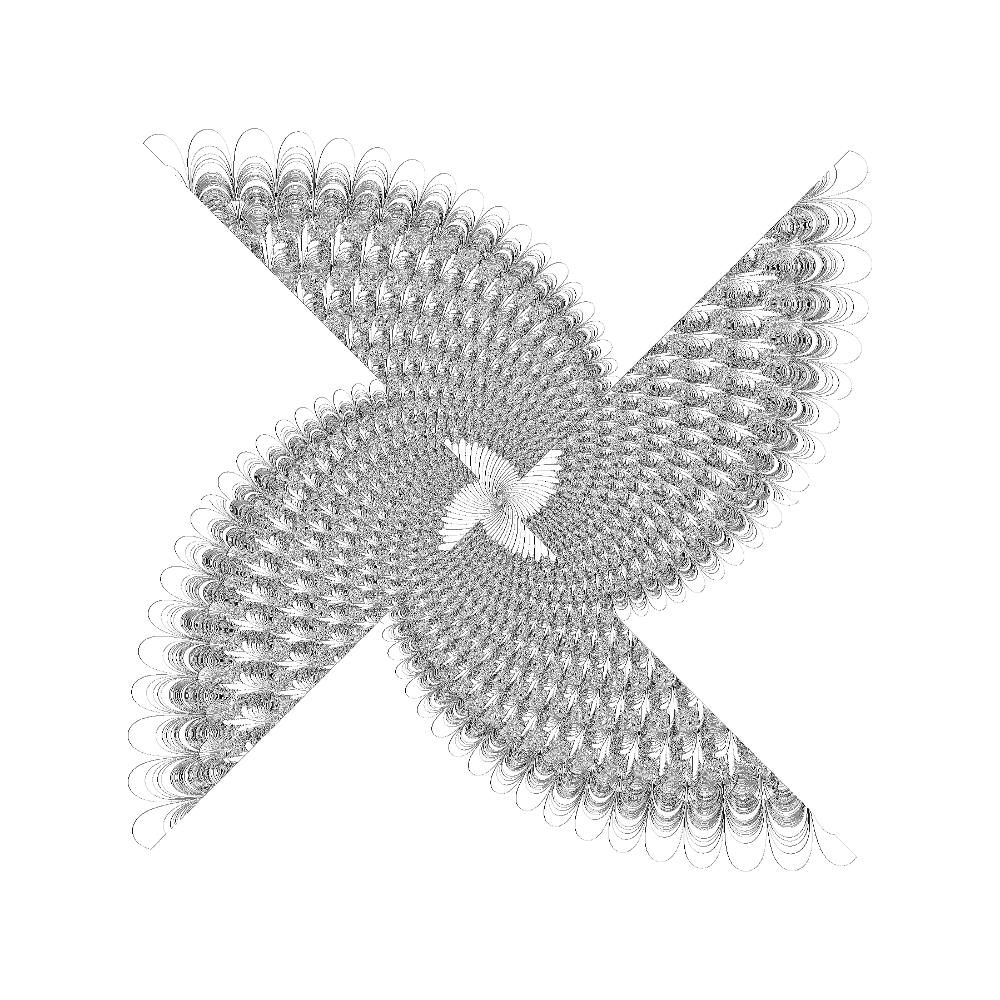

             extrema:  [(0, 255)] 

               count:  [1048576] 

                 sum:  [121452365.0] 

                sum2:  [20949501937.0] 

                mean:  [115.82600116729736] 

              median:  [115] 

                 rms:  [141.34709738378035] 

                 var:  [6563.339392413114] 

              stddev:  [81.01443940689286] 

     image_file_name:  z_conv_lamber.8.33.23_1.22.2009.png 



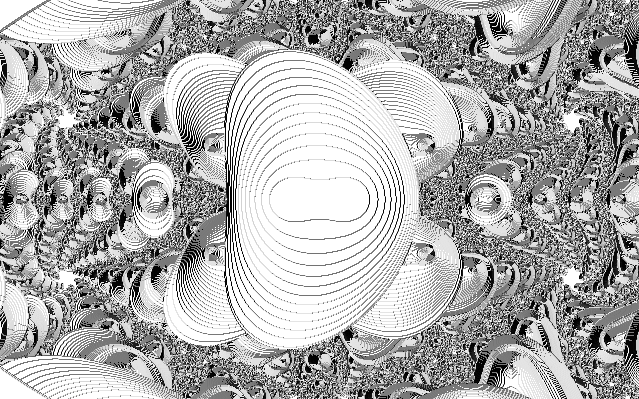

             extrema:  [(0, 255)] 

               count:  [1048576] 

                 sum:  [121452365.0] 

                sum2:  [20949501937.0] 

                mean:  [115.82600116729736] 

              median:  [115] 

                 rms:  [141.34709738378035] 

                 var:  [6563.339392413114] 

              stddev:  [81.01443940689286] 

     image_file_name:  z_conv_JZ3pCAKstar.png 



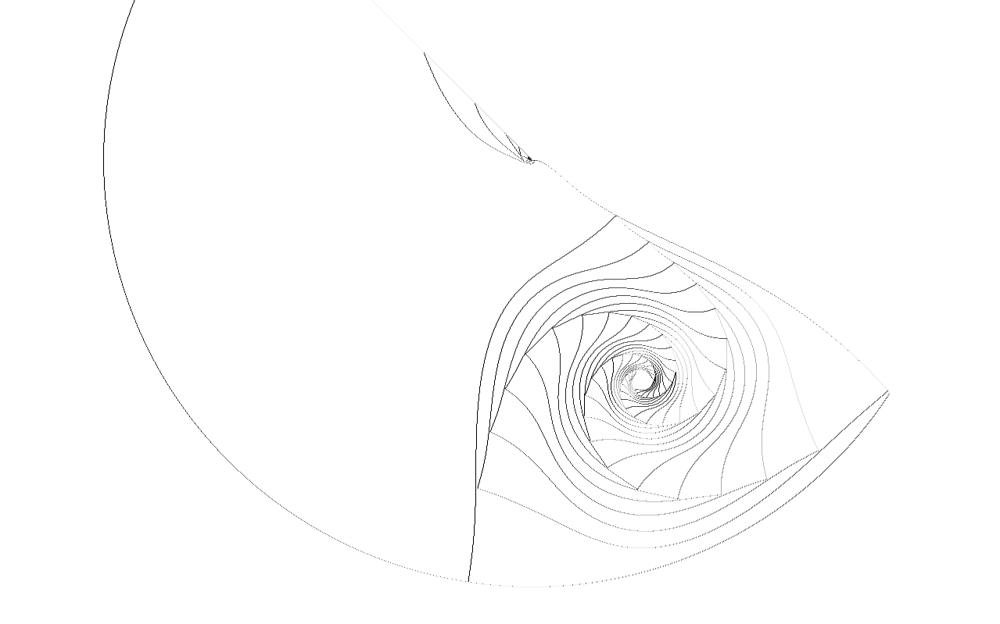

             extrema:  [(0, 255)] 

               count:  [1048576] 

                 sum:  [121452365.0] 

                sum2:  [20949501937.0] 

                mean:  [115.82600116729736] 

              median:  [115] 

                 rms:  [141.34709738378035] 

                 var:  [6563.339392413114] 

              stddev:  [81.01443940689286] 

     image_file_name:  z_conv_Uno.png 



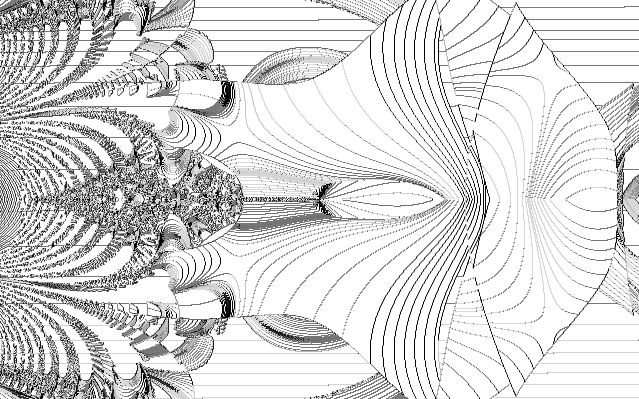

             extrema:  [(0, 255)] 

               count:  [1048576] 

                 sum:  [121452365.0] 

                sum2:  [20949501937.0] 

                mean:  [115.82600116729736] 

              median:  [115] 

                 rms:  [141.34709738378035] 

                 var:  [6563.339392413114] 

              stddev:  [81.01443940689286] 

     image_file_name:  z_conv_face_Sep_9_2017.png 



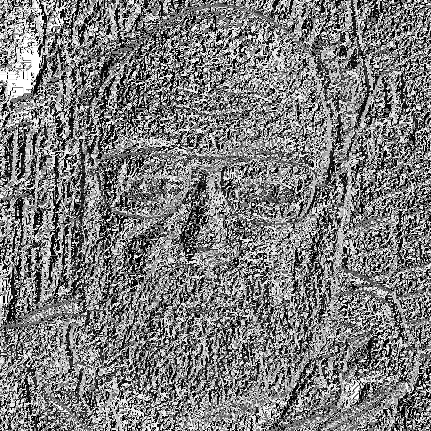

             extrema:  [(0, 255)] 

               count:  [1048576] 

                 sum:  [121452365.0] 

                sum2:  [20949501937.0] 

                mean:  [115.82600116729736] 

              median:  [115] 

                 rms:  [141.34709738378035] 

                 var:  [6563.339392413114] 

              stddev:  [81.01443940689286] 

     image_file_name:  z_conv_Quatrow.png 



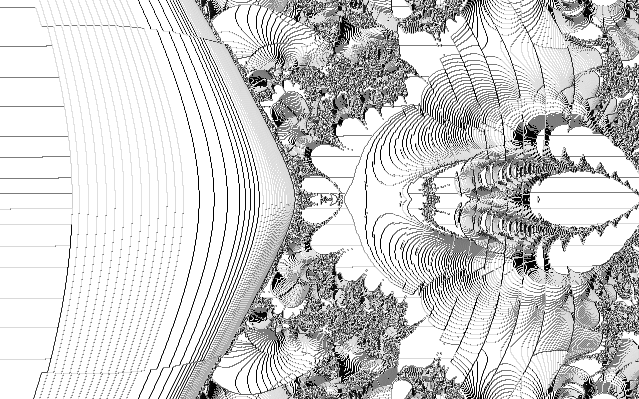

             extrema:  [(0, 255)] 

               count:  [1048576] 

                 sum:  [121452365.0] 

                sum2:  [20949501937.0] 

                mean:  [115.82600116729736] 

              median:  [115] 

                 rms:  [141.34709738378035] 

                 var:  [6563.339392413114] 

              stddev:  [81.01443940689286] 

     image_file_name:  z2dazexp.png 



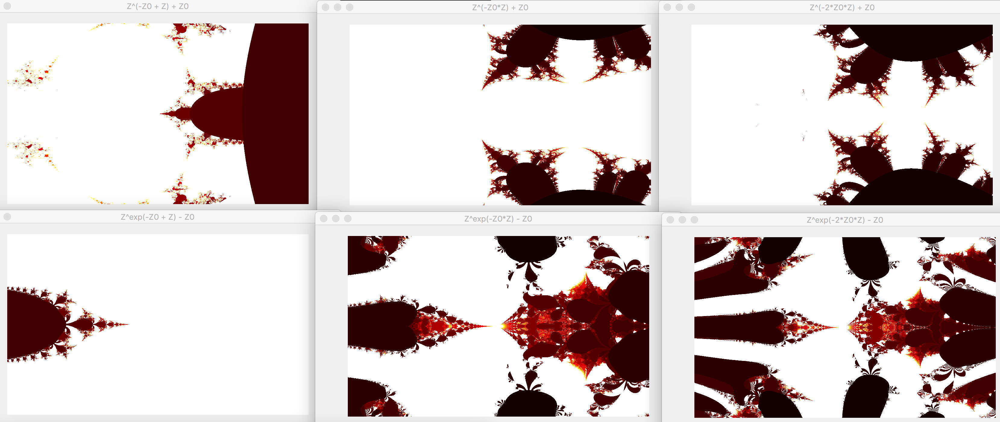

             extrema:  [(0, 255)] 

               count:  [1048576] 

                 sum:  [121452365.0] 

                sum2:  [20949501937.0] 

                mean:  [115.82600116729736] 

              median:  [115] 

                 rms:  [141.34709738378035] 

                 var:  [6563.339392413114] 

              stddev:  [81.01443940689286] 

     image_file_name:  BackPropOverview.png 



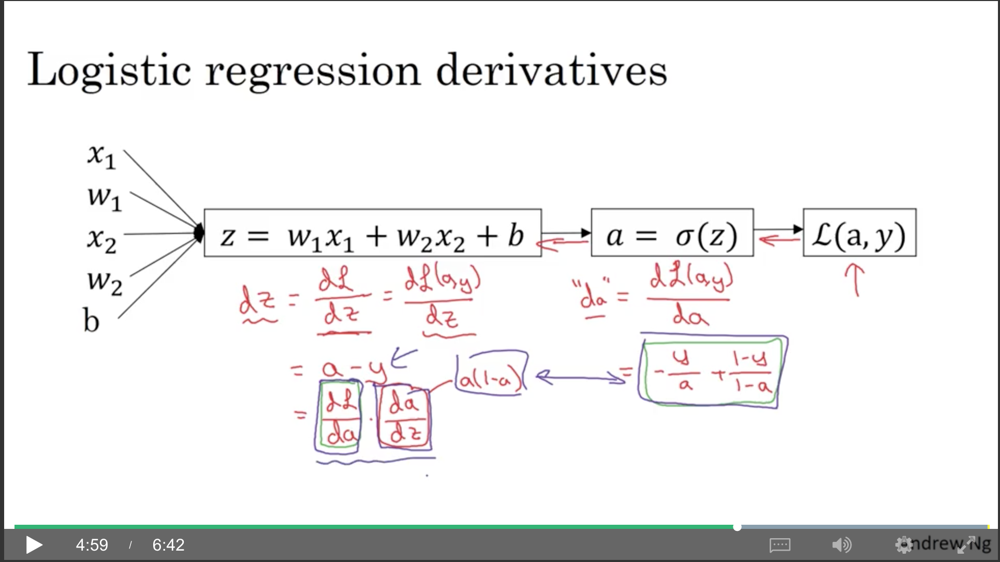

             extrema:  [(0, 255)] 

               count:  [1048576] 

                 sum:  [121452365.0] 

                sum2:  [20949501937.0] 

                mean:  [115.82600116729736] 

              median:  [115] 

                 rms:  [141.34709738378035] 

                 var:  [6563.339392413114] 

              stddev:  [81.01443940689286] 

     image_file_name:  LogRegDerivati.png 



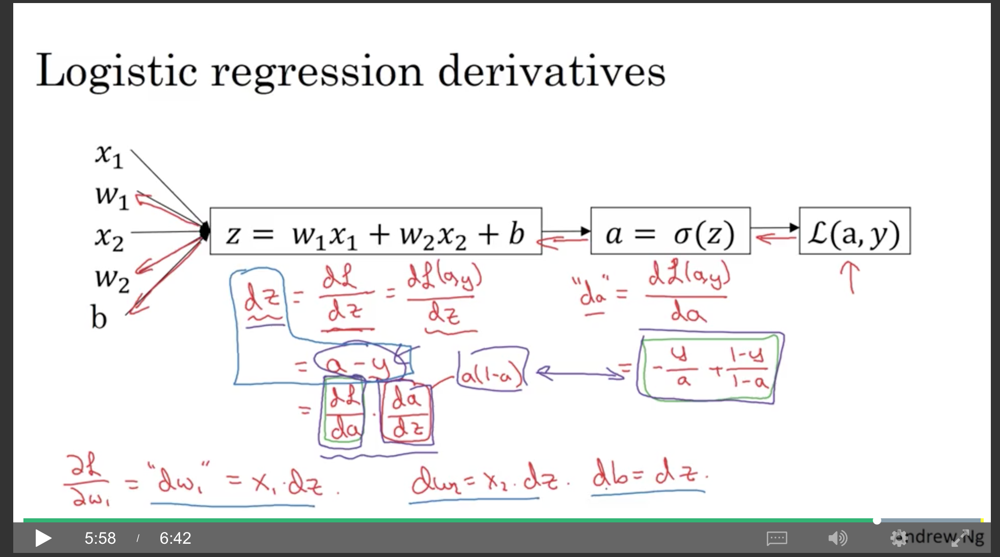

             extrema:  [(0, 255)] 

               count:  [1048576] 

                 sum:  [121452365.0] 

                sum2:  [20949501937.0] 

                mean:  [115.82600116729736] 

              median:  [115] 

                 rms:  [141.34709738378035] 

                 var:  [6563.339392413114] 

              stddev:  [81.01443940689286] 

     image_file_name:  z_conv_Karl_Bodmer_Travels_in_America_(35).png 



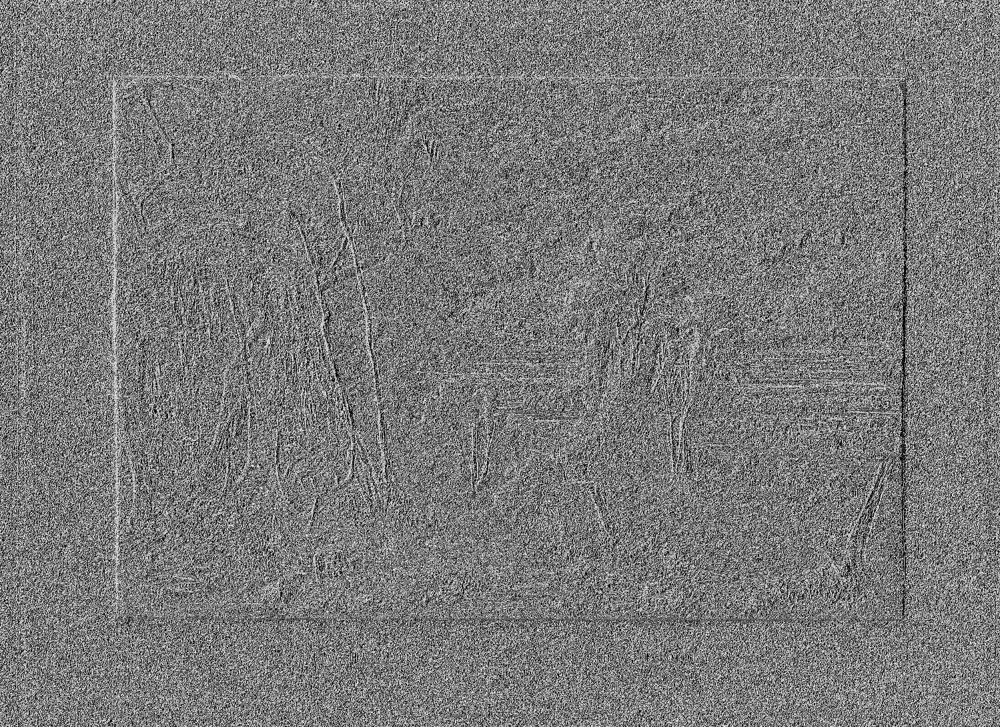

             extrema:  [(0, 255)] 

               count:  [1048576] 

                 sum:  [121452365.0] 

                sum2:  [20949501937.0] 

                mean:  [115.82600116729736] 

              median:  [115] 

                 rms:  [141.34709738378035] 

                 var:  [6563.339392413114] 

              stddev:  [81.01443940689286] 

     image_file_name:  z_conv_face_276.png 



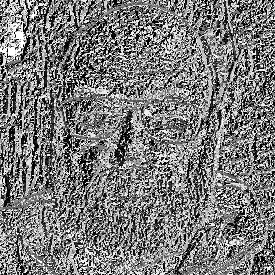

             extrema:  [(0, 255)] 

               count:  [1048576] 

                 sum:  [121452365.0] 

                sum2:  [20949501937.0] 

                mean:  [115.82600116729736] 

              median:  [115] 

                 rms:  [141.34709738378035] 

                 var:  [6563.339392413114] 

              stddev:  [81.01443940689286] 

     image_file_name:  z_conv_Me_2_May_16_2018.png 



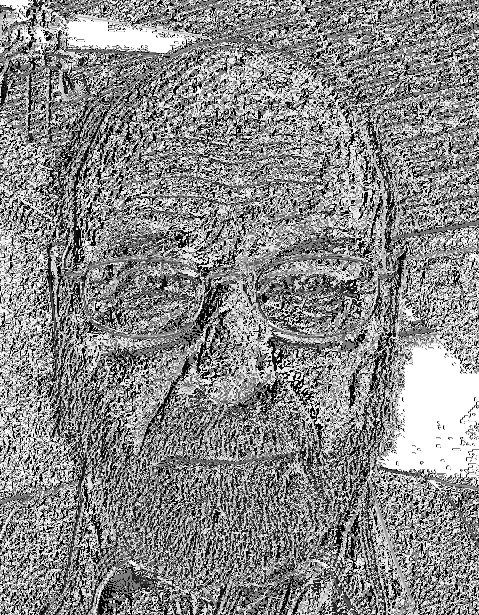

             extrema:  [(0, 255)] 

               count:  [1048576] 

                 sum:  [121452365.0] 

                sum2:  [20949501937.0] 

                mean:  [115.82600116729736] 

              median:  [115] 

                 rms:  [141.34709738378035] 

                 var:  [6563.339392413114] 

              stddev:  [81.01443940689286] 

     image_file_name:  z_conv_JkrOlivekRkB.13.20.58_6.06.2010.png 



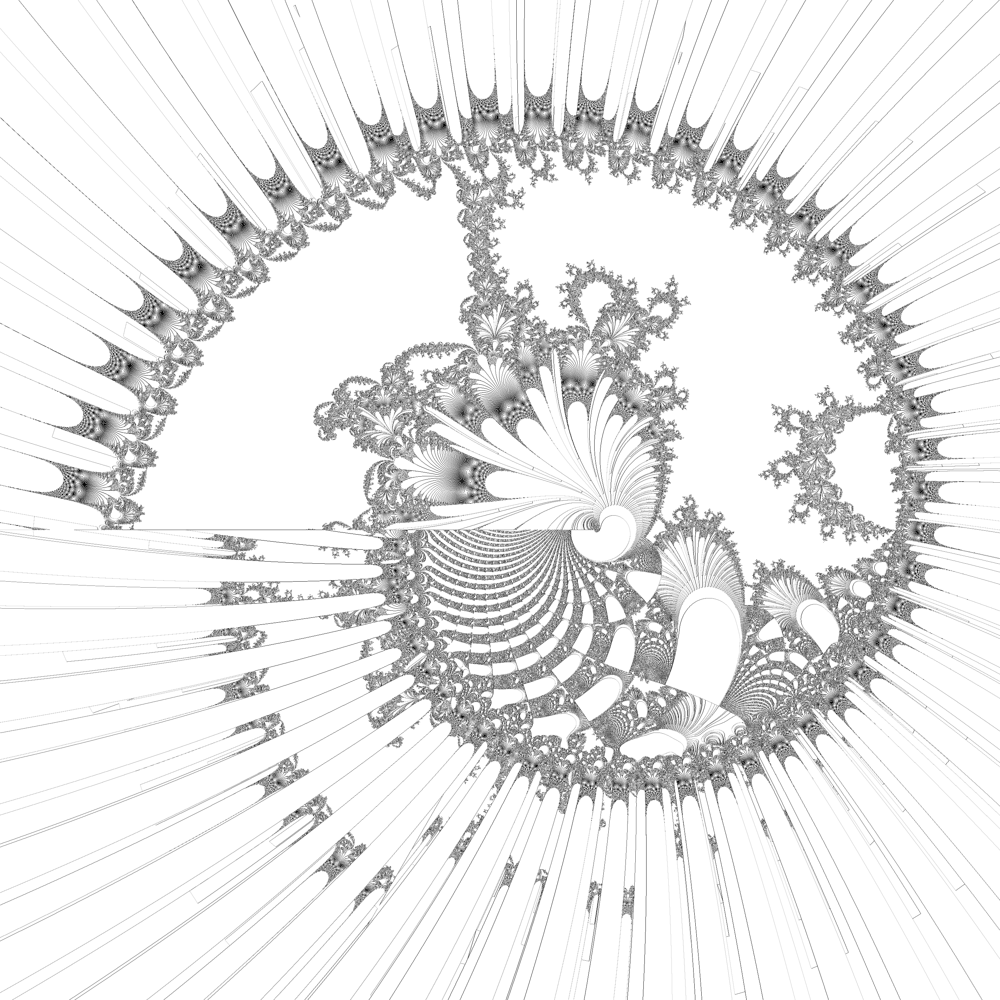

             extrema:  [(0, 255)] 

               count:  [1048576] 

                 sum:  [121452365.0] 

                sum2:  [20949501937.0] 

                mean:  [115.82600116729736] 

              median:  [115] 

                 rms:  [141.34709738378035] 

                 var:  [6563.339392413114] 

              stddev:  [81.01443940689286] 

     image_file_name:  adecPwrAFxLFQNTAAADW.png 



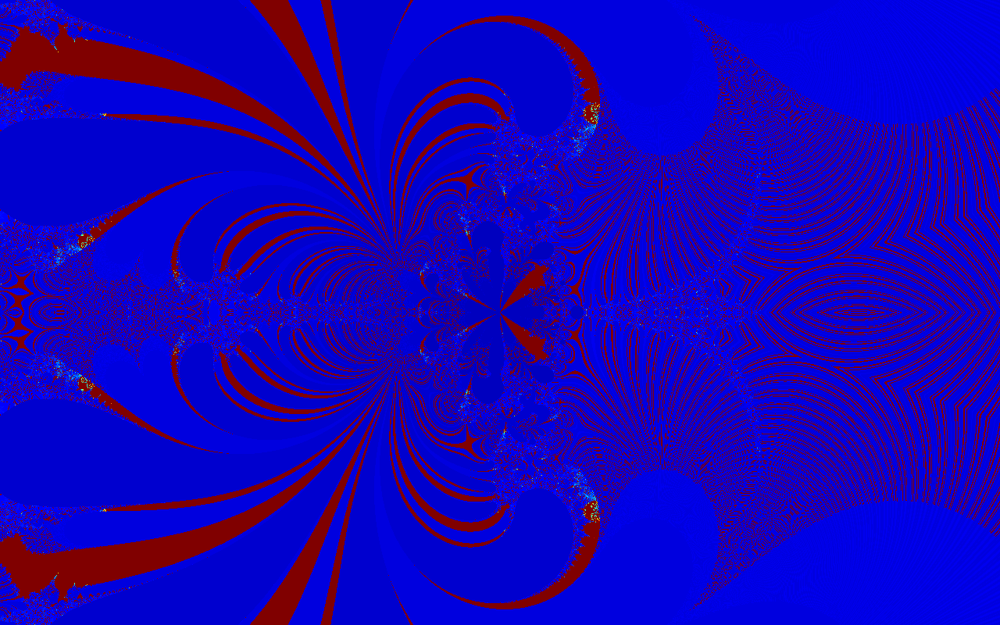

             extrema:  [(0, 255)] 

               count:  [1048576] 

                 sum:  [121452365.0] 

                sum2:  [20949501937.0] 

                mean:  [115.82600116729736] 

              median:  [115] 

                 rms:  [141.34709738378035] 

                 var:  [6563.339392413114] 

              stddev:  [81.01443940689286] 

     image_file_name:  z_conv_OneWhack.19.17.25_8.07.2008.png 



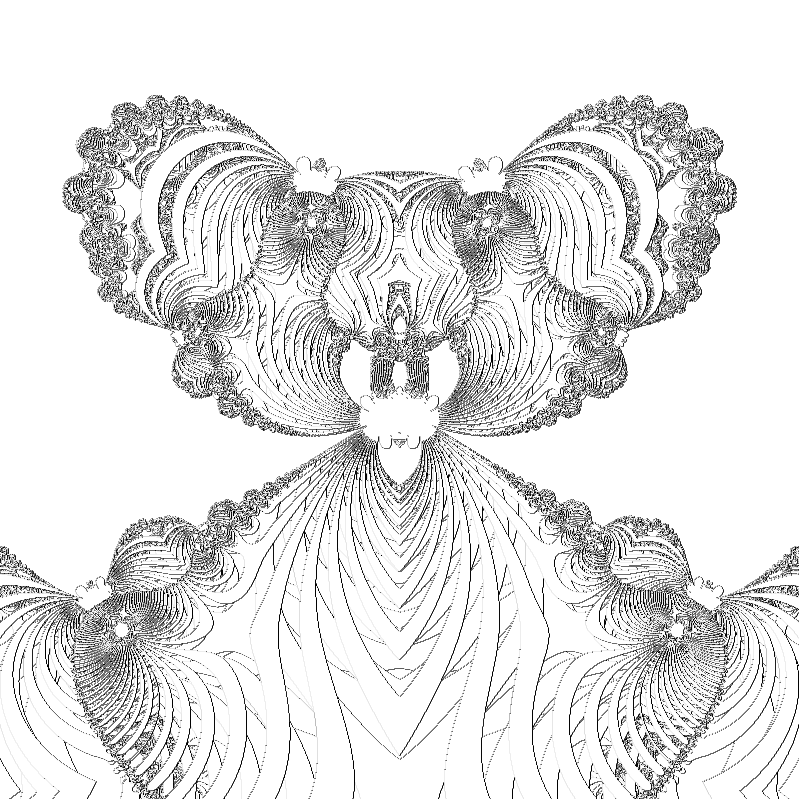

             extrema:  [(0, 255)] 

               count:  [1048576] 

                 sum:  [121452365.0] 

                sum2:  [20949501937.0] 

                mean:  [115.82600116729736] 

              median:  [115] 

                 rms:  [141.34709738378035] 

                 var:  [6563.339392413114] 

              stddev:  [81.01443940689286] 

     image_file_name:  decPwrAFxLFQNTAABCL.png 



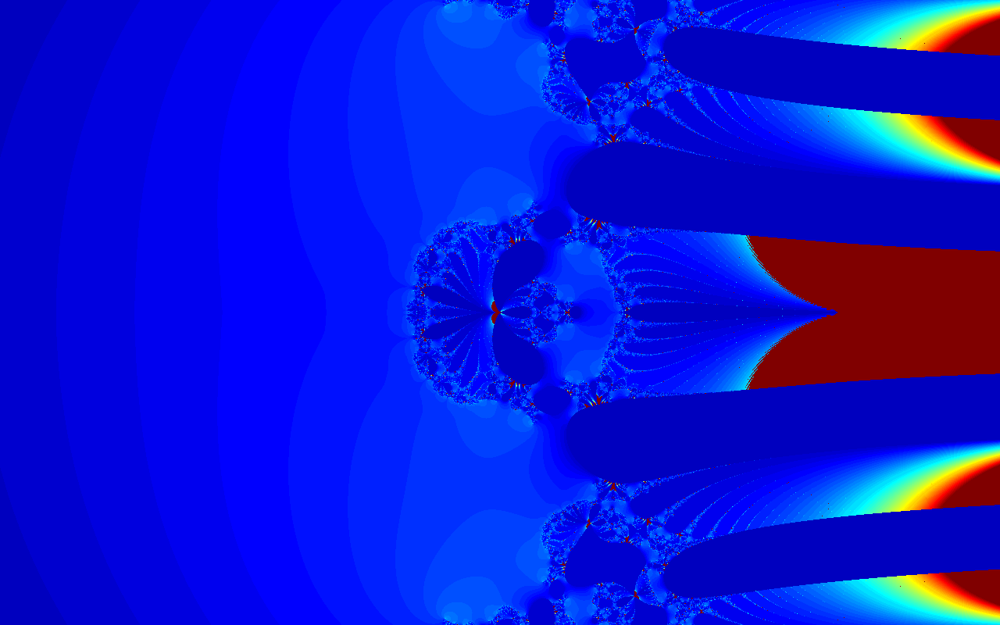

In [10]:
FILE_EXT = ['.png']
# im_dir = os.path.abspath('../images')
file_list = os.listdir(im_dir)
png_files = []
for maybe_file in file_list:
    _, file_ext = os.path.splitext(maybe_file)
    if file_ext in FILE_EXT:
        show_image_stats(maybe_file, im_dir)

             extrema:  [(0, 255)] 

               count:  [1048576] 

                 sum:  [121452365.0] 

                sum2:  [20949501937.0] 

                mean:  [115.82600116729736] 

              median:  [115] 

                 rms:  [141.34709738378035] 

                 var:  [6563.339392413114] 

              stddev:  [81.01443940689286] 

     image_file_name:  helloKeras.png 



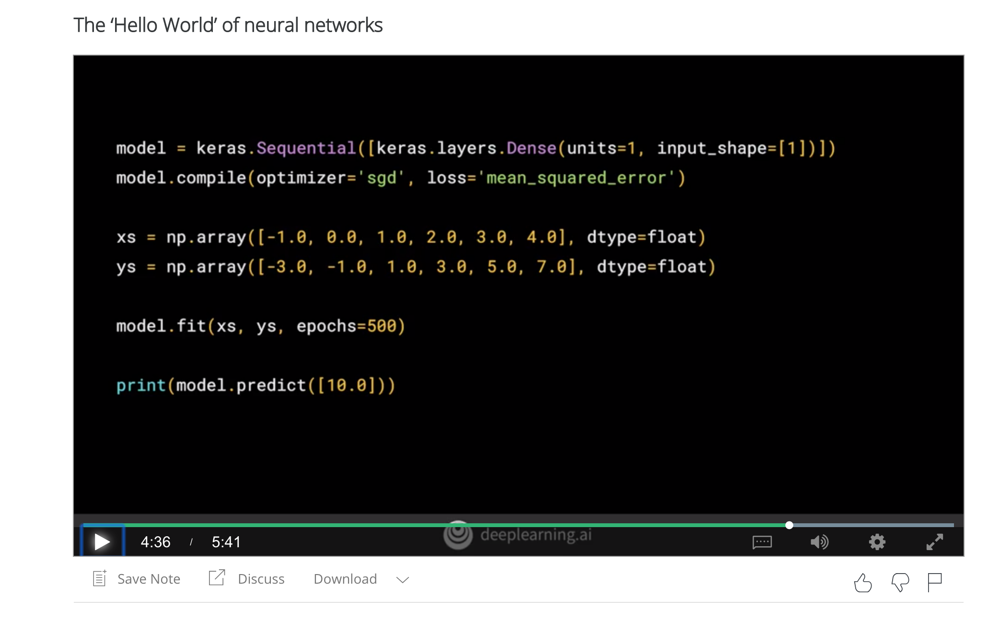

In [11]:
# helloKeras.png
imfiledir = '/Users/mojo/git_clone/dlanier/La_Machina_Fractal_Arien/images'
imfilename = 'helloKeras.png'
show_image_stats(imfilename, imfiledir)

             extrema:  [(0, 255)] 

               count:  [1048576] 

                 sum:  [121452365.0] 

                sum2:  [20949501937.0] 

                mean:  [115.82600116729736] 

              median:  [115] 

                 rms:  [141.34709738378035] 

                 var:  [6563.339392413114] 

              stddev:  [81.01443940689286] 

     image_file_name:  adecPwrAFxLFQNTAAAFD.png 



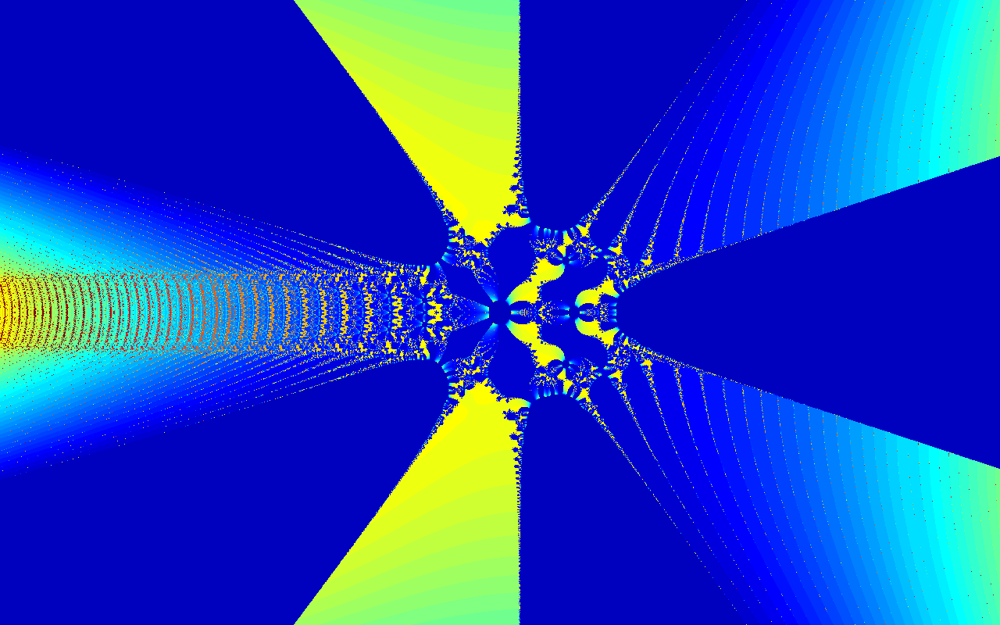

In [12]:
imfiledir = '/Users/mojo/git_clone/dlanier/La_Machina_Fractal_Arien/images'
imfilename = 'adecPwrAFxLFQNTAAAFD.png'
show_image_stats(imfilename, imfiledir)

             extrema:  [(0, 255)] 

               count:  [1048576] 

                 sum:  [121452365.0] 

                sum2:  [20949501937.0] 

                mean:  [115.82600116729736] 

              median:  [115] 

                 rms:  [141.34709738378035] 

                 var:  [6563.339392413114] 

              stddev:  [81.01443940689286] 

     image_file_name:  adecPwrAFxLFQNTAAADW.png 



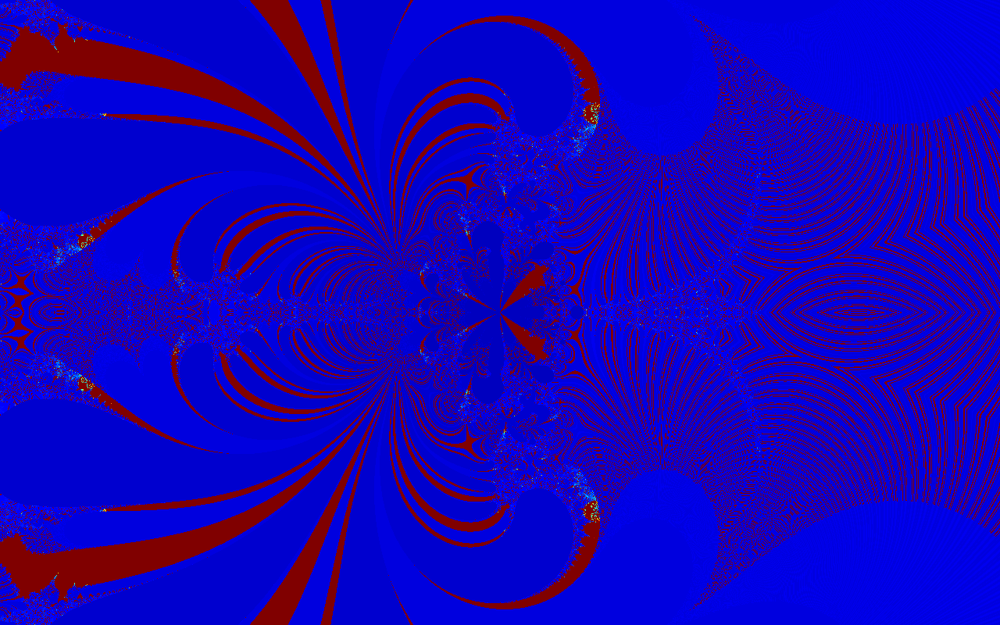

In [13]:
# adecPwrAFxLFQNTAAADW.png
imfiledir = '/Users/mojo/git_clone/dlanier/La_Machina_Fractal_Arien/images'
imfilename = 'adecPwrAFxLFQNTAAADW.png'
show_image_stats(imfilename, imfiledir)